### Dataset after augmentation

In [1]:
import os

root_folder= 'D:/yogi/shoppin/ImageNet-Mini/augmented_images_200'
img_paths= []
labels= []

labels_set= set()

for dir, folder, files in os.walk(root_folder):

  if len(labels_set) >= 200:
    break

  for file in files:
    labels_set.add(os.path.basename(dir))
    img_path= os.path.join(dir, file)
    img_paths.append(img_path)
    labels.append(os.path.basename(dir))

In [2]:
from sklearn import preprocessing

label_encoder= preprocessing.LabelEncoder()
img_ids= label_encoder.fit_transform(labels)

In [3]:
len(img_ids)

34697

### Dataset split

In [4]:
from math import floor
import random

def split_data(img_paths, img_ids):

    # Combine data and labels into a list of tuples
    combined = list(zip(img_paths, img_ids))

    random.seed(42)

    # Shuffle the combined list
    random.shuffle(combined)

    # Split the shuffled combined list into two lists
    split_index1 = floor(len(combined) * 0.8)
    split_index2 = floor(len(combined) * 0.9)

    train_combined  = combined[:split_index1]
    test_combined   = combined[split_index1:split_index2]
    enroll_combined = combined[split_index2:]

    # Unpack the combined tuples into separate paths and labels
    train_img_paths, train_img_ids   = zip(*train_combined)
    test_img_paths, test_img_ids     = zip(*test_combined)
    enroll_img_paths, enroll_img_ids = zip(*enroll_combined)

    return train_img_paths, train_img_ids, test_img_paths, test_img_ids, enroll_img_paths, enroll_img_ids


In [5]:
import torch

train_img_paths, train_img_ids, test_img_paths, test_img_ids, enroll_img_paths, enroll_img_ids= split_data(img_paths, img_ids)


c:\Users\ShivajiWankhede\AppData\Local\Programs\Python\Python39\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
# Ensure labels are converted to PyTorch tensors
train_img_ids = torch.tensor(train_img_ids)
test_img_ids = torch.tensor(test_img_ids)

### Dataloader

In [7]:
import os
import pandas as pd
from PIL import Image
from torchvision.io import read_image
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import torch

In [8]:
class CustomImageDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None, target_transform=None):
        self.image_paths = image_paths
        self.labels= labels
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert('RGB')
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)
        return image, label

In [9]:
def transform_image():
  
  transform= transforms.Compose([
      transforms.RandomHorizontalFlip(),
      transforms.RandomResizedCrop(224),
      transforms.ToTensor(),
      transforms.Lambda(lambda img: img.repeat(3, 1, 1) if img.shape[0] == 1 else img),
      transforms.Normalize(mean=0.5,  # Standard ImageNet normalization
      std=0.5)
  ])

  return transform

In [10]:
training_data   = CustomImageDataset(train_img_paths, train_img_ids, transform_image())
val_data        = CustomImageDataset(test_img_paths, test_img_ids, transform_image())

train_dataloader = DataLoader(training_data, batch_size=64, shuffle=True)
val_dataloader = DataLoader(val_data, batch_size=64, shuffle=True)

### Model Configuration

In [11]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torchvision.models import vit_b_32, swin_t
from transformers import ViTForImageClassification, ViTFeatureExtractor

In [12]:
# Check if GPU is available
device = "cuda" if torch.cuda.is_available() else "cpu"

In [20]:
# Configuration
BATCH_SIZE = 128
EPOCHS = 1
LEARNING_RATE = 1e-4
IMG_SIZE = 224
NUM_CLASSES = 200  # Update with the number of classes in your dataset

In [21]:
# 2. Model Definition
# model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224-in21k',num_labels=NUM_CLASSES).to(device)
# model= vit_b_32(weights= 'ViT_B_32_Weights.DEFAULT')
model= swin_t(weights= True)

In [22]:
model.head= nn.Linear(768, 200)
# print(model)

In [23]:
model.load_state_dict(torch.load('./checkpoints/swin_200.pth'))

<All keys matched successfully>

In [24]:
# 3. Define Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE, weight_decay=1e-5)

In [25]:
from tqdm import tqdm

# 4. Training Loop
def train(model, train_loader, val_loader, criterion, optimizer, epochs):
    model= model.to(device)
    
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        count= 0

        # Initialize tqdm for the training loop
        with tqdm(total=len(train_loader), desc=f"Epoch {epoch+1}/{epochs}", unit="batch") as pbar:
            for inputs, labels in train_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()

                outputs = model(inputs)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()

                running_loss += loss.item()
                _, predicted = outputs.max(1)
                total += labels.size(0)
                correct += predicted.eq(labels).sum().item()
                # print(count)
                # count += 1
                pbar.set_postfix({"Loss": f"{running_loss / (pbar.n + 1):.4f}"})  # Show average loss
                pbar.update(1)  # Update progress bar by 1 step

            train_accuracy = 100 * correct / total
            print(f"Epoch [{epoch+1}/{epochs}] - Loss: {running_loss/len(train_loader):.4f}, Accuracy: {train_accuracy:.2f}%")

            # Validation
            validate(model, val_loader, criterion)


def validate(model, val_loader, criterion):
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()

            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

    val_accuracy = 100 * correct / total
    print(f"Validation - Loss: {val_loss/len(val_loader):.4f}, Accuracy: {val_accuracy:.2f}%")

In [26]:
# 5. Train the Model
train(model, train_dataloader, val_dataloader, criterion, optimizer, EPOCHS)

Epoch 1/1:   0%|          | 0/434 [00:00<?, ?batch/s]

Epoch 1/1:  34%|███▍      | 147/434 [22:30<43:56,  9.19s/batch, Loss=0.1921]  


KeyboardInterrupt: 

In [27]:
feature_extractor= nn.Sequential(*list(model.children())[:-1])

In [44]:
torch.save(feature_extractor.state_dict(),'./checkpoints/swin_feature_extractor_200.pth')

In [31]:
feature_extractor.load_state_dict(torch.load('./checkpoints/swin_feature_extractor_200.pth'))

<All keys matched successfully>

### VIT Inferencing

In [ ]:
from transformers import ViTImageProcessor, ViTForImageClassification
from PIL import Image
import requests

url = 'http://images.cocodataset.org/val2017/000000039769.jpg'
image = Image.open(requests.get(url, stream=True).raw)

processor = ViTImageProcessor.from_pretrained('google/vit-base-patch16-224')
model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224')

In [ ]:
inputs = processor(images=image, return_tensors="pt")
outputs = model(**inputs)
logits = outputs.logits
# model predicts one of the 1000 ImageNet classes
predicted_class_idx = logits.argmax(-1).item()
print("Predicted class:", model.config.id2label[predicted_class_idx])

### Enroll

In [51]:
import json
import os

# Convert tensors to lists for serialization
def tensor_to_list(obj):
    if isinstance(obj, torch.Tensor):
        return obj.tolist()  # Convert tensor to list
    raise TypeError(f"Object of type {obj.__class__.__name__} is not serializable")

def enroll_image(image_path, directory= './database_swin', model=None, weights= True, transformation= transform_image()):

  image= Image.open(image_path).convert('RGB')
  transformed_image= transformation(image).unsqueeze(0).to(device)


  # if model== None:
  
  #   if weights== True:
  #     model= resnet34(weights=True)
  #     model = nn.Sequential(*list(model.children())[:-1])
  #     model.load_state_dict(torch.load('checkpoints/feature_extractor_without_detector.pth'))
    
  #   else:
  #     model= resnet34(weights=True)
  #     model = nn.Sequential(*list(model.children())[:-1])

  model.eval()  
  embeddings= model(transformed_image).reshape(1,-1)
  
  # name= image_path.split('.JPEG')[0] + '.json'
  name= os.path.basename(image_path).split('.JPEG')[0] + '.json'
  # print(name)

  output_path= os.path.join(directory, name)
  # print(output_path)
  value= {image_path: embeddings}
  # print(value)

  with open(output_path, 'w') as f:
      json.dump(value, f, default=tensor_to_list)


In [53]:
for i, path in enumerate(train_img_paths):
    enroll_image( path, model= feature_extractor)

### Evaluation

In [28]:
import requests
from PIL import Image
from io import BytesIO

def download_image(url):
    # try:
    # Send an HTTP GET request to the URL
    response = requests.get(url)
    response.raise_for_status()  # Raise an exception for HTTP errors
    
    # Open the image from the response content
    img = Image.open(BytesIO(response.content))

    return img

In [30]:
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import numpy as np
import json

def precision_at_k(image_path=None, url= None, model= None, database_folder='./database_swin', k=1, transformation= transform_image()):
    
    probe_label= os.path.basename(os.path.dirname(image_path))

    if url== None:
        image= Image.open(image_path)
        transformed_image= transformation(image).unsqueeze(0).to(device)
    else:
        image= download_image(url)
        transformed_image= transformation(image).unsqueeze(0).to(device)

    # if model== None:
    #     model= resnet34(weights=True)
    #     model.load_state_dict(torch.load('checkpoints/model_200.pth'))
    #     model = nn.Sequential(*list(model.children())[:-1])

    model.eval()

    with torch.no_grad():
        query_embedding= model(transformed_image).reshape(1,-1).cpu()

    scores= []

    # Iterate over all JSON files in the database folder
    for json_file in os.listdir(database_folder):
        if json_file.endswith('.json'):
            json_path = os.path.join(database_folder, json_file)
            
            # Load embeddings from the current JSON file
            with open(json_path, 'r') as file:
                database = json.load(file)
            
            # Calculate cosine similarity for each embedding in the JSON file
            for path, emb in database.items():
                folder= os.path.basename(os.path.dirname(path))
                # labels.append(folder)
                emb_tensor = torch.tensor(emb).cpu().detach().numpy()
                score = cosine_similarity(emb_tensor.reshape(1, -1), query_embedding.numpy())
                scores.append((folder, score))


    sorted_scores = sorted(scores, key=lambda x: x[1][0][0], reverse=True)

    True_positive= 0


    for i in range(k):
        if sorted_scores[i][0] == probe_label:
            True_positive += 1

    precision= True_positive/k

    print(f'Precision@k={k}: {precision}')

    return precision

In [33]:
def recall_at_k(image_path=None, url= None, model= None, database_folder='./database_swin', k=1, transformation= transform_image()):
    
    probe_label= os.path.basename(os.path.dirname(image_path))

    if url== None:
        image= Image.open(image_path)
        transformed_image= transformation(image).unsqueeze(0).to(device)
    else:
        image= download_image(url)
        transformed_image= transformation(image).unsqueeze(0).to(device)

    # if model== None:
    #     model= resnet34(weights=True)
    #     model.load_state_dict(torch.load('checkpoints/model_200.pth'))
    #     model = nn.Sequential(*list(model.children())[:-1])

    model.eval()

    with torch.no_grad():
        query_embedding= model(transformed_image).reshape(1,-1).cpu()

    scores= []
    True_positive= 0
    Total_relevant_items= 0

    # Iterate over all JSON files in the database folder
    for json_file in os.listdir(database_folder):
        if json_file.endswith('.json'):
            json_path = os.path.join(database_folder, json_file)
            
            # Load embeddings from the current JSON file
            with open(json_path, 'r') as file:
                database = json.load(file)
            
            # Calculate cosine similarity for each embedding in the JSON file
            for path, emb in database.items():
                folder= os.path.basename(os.path.dirname(path))

                if folder == probe_label:
                    Total_relevant_items += 1
                
                emb_tensor = torch.tensor(emb).cpu().detach().numpy()
                score = cosine_similarity(emb_tensor.reshape(1, -1), query_embedding.numpy())
                scores.append((folder, score))


    sorted_scores = sorted(scores, key=lambda x: x[1][0][0], reverse=True)



    for i in range(k):
        if sorted_scores[i][0] == probe_label:
            True_positive += 1

    

    recall= True_positive/Total_relevant_items

    print(f'recall@k={k}: {recall}')

    return recall    

In [32]:
sum= 0
for img_path in test_img_paths[100:110]:
    value= precision_at_k(img_path, model= feature_extractor, k=10)
    sum += value

print(f'average precision @ k=10: {sum/10}')

Precision@k=10: 1.0
Precision@k=10: 1.0
Precision@k=10: 1.0
Precision@k=10: 1.0
Precision@k=10: 1.0
Precision@k=10: 1.0
Precision@k=10: 1.0
Precision@k=10: 1.0
Precision@k=10: 1.0
Precision@k=10: 1.0
average precision @ k=10: 1.0


In [35]:
sum= 0
for img_path in test_img_paths[100:110]:
    value= recall_at_k(img_path, model= feature_extractor, k=50)
    sum += value

print(f'average recall @ k=10: {sum/10}')

recall@k=50: 0.46511627906976744
recall@k=50: 0.4083333333333333
recall@k=50: 0.21138211382113822
recall@k=50: 0.310126582278481
recall@k=50: 0.32679738562091504
recall@k=50: 0.43103448275862066
recall@k=50: 0.2721518987341772
recall@k=50: 0.45045045045045046
recall@k=50: 0.4065040650406504
recall@k=50: 0.3671875
average recall @ k=10: 0.3649084091107534


### Probe

In [54]:
import requests
from PIL import Image
from io import BytesIO

def download_image(url):
    # try:
    # Send an HTTP GET request to the URL
    response = requests.get(url)
    response.raise_for_status()  # Raise an exception for HTTP errors
    
    # Open the image from the response content
    img = Image.open(BytesIO(response.content))

    return img

In [57]:
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import numpy as np

def top_k_matches(image_path=None, url= None, model= None, database_folder='./database_swin', k=1, transformation= transform_image()):

    if url== None:
        image= Image.open(image_path)
        transformed_image= transformation(image).unsqueeze(0).to(device)
    else:
        image= download_image(url)
        transformed_image= transformation(image).unsqueeze(0).to(device)

    # if model== None:
    #     model= resnet34(weights=True)
    #     model = nn.Sequential(*list(model.children())[:-1])
    #     model.load_state_dict(torch.load('checkpoints/feature_extractor_without_detector.pth'))

    model.eval()

    with torch.no_grad():
        query_embedding= model(transformed_image).reshape(1,-1).cpu()

    scores= []

        # Iterate over all JSON files in the database folder
    for json_file in os.listdir(database_folder):
        if json_file.endswith('.json'):
            json_path = os.path.join(database_folder, json_file)
            
            # Load embeddings from the current JSON file
            with open(json_path, 'r') as file:
                database = json.load(file)
            
            # Calculate cosine similarity for each embedding in the JSON file
            for path, emb in database.items():
                emb_tensor = torch.tensor(emb).cpu().detach().numpy()
                score = cosine_similarity(emb_tensor.reshape(1, -1), query_embedding.numpy())
                scores.append((path, score))

    # for path, emb in database.items():

    #     emb= emb.detach().numpy()

    #     score= cosine_similarity(emb, embeddings)
    #     scores.append((path,score))

    
    print(f'pehle scores: {scores}')

    # sorted(scores, key= lambda x:x[1], reverse= True)
    # Sort the score list by the second value in reverse order
    sorted_scores = sorted(scores, key=lambda x: x[1][0][0], reverse=True)

    print(f'scores: {sorted_scores}')

    # Define the grid size (rows and columns)
    rows = k
    cols = 2  # Adjust rows and cols based on `k`


    # Plot the images
    fig, axes = plt.subplots(rows, cols, figsize=(10, 6))

    # If axes is a single object (when k=1), convert it to a list for consistency
    # if isinstance(axes, plt.Axes):
        # axes = np.array([[axes]])  # Convert it to a 2D array with one element

        # If axes is a single object (when k=1), convert it to a 2D array for consistency
    if rows == 1:
        axes = np.array([axes])  # Convert to 2D array with one row

    # Loop through each row to plot input image and the corresponding match
    for i in range(rows):
        # Plot the input image in the first column
        axes[i, 0].imshow(image)
        axes[i, 0].axis('off')
        axes[i, 0].set_title('Input Image')

        # Plot the corresponding top match in the second column
        if i < k:
            retrieved_image = Image.open(sorted_scores[i][0])
            axes[i, 1].imshow(retrieved_image)
            axes[i, 1].axis("off")
            axes[i, 1].set_title(f"Match {i + 1}")
        else:
            axes[i, 1].axis("off")  # Turn off any extra axes

    plt.tight_layout()
    plt.show()
    

    return sorted_scores

pehle scores: [('D:/yogi/shoppin/ImageNet-Mini/augmented_images\\n01729977\\ILSVRC2012_val_00000029_aug_0.JPEG', array([[-0.01186654]], dtype=float32)), ('D:/yogi/shoppin/ImageNet-Mini/augmented_images\\n01729977\\ILSVRC2012_val_00000029_aug_13.JPEG', array([[0.00607851]], dtype=float32)), ('D:/yogi/shoppin/ImageNet-Mini/augmented_images\\n01729977\\ILSVRC2012_val_00000029_aug_14.JPEG', array([[0.05603311]], dtype=float32)), ('D:/yogi/shoppin/ImageNet-Mini/augmented_images\\n01729977\\ILSVRC2012_val_00000029_aug_15.JPEG', array([[-0.02224587]], dtype=float32)), ('D:/yogi/shoppin/ImageNet-Mini/augmented_images\\n01729977\\ILSVRC2012_val_00000029_aug_16.JPEG', array([[-0.0195178]], dtype=float32)), ('D:/yogi/shoppin/ImageNet-Mini/augmented_images\\n01729977\\ILSVRC2012_val_00000029_aug_19.JPEG', array([[0.04583348]], dtype=float32)), ('D:/yogi/shoppin/ImageNet-Mini/augmented_images\\n01729977\\ILSVRC2012_val_00000029_aug_2.JPEG', array([[-0.01837903]], dtype=float32)), ('D:/yogi/shoppin/

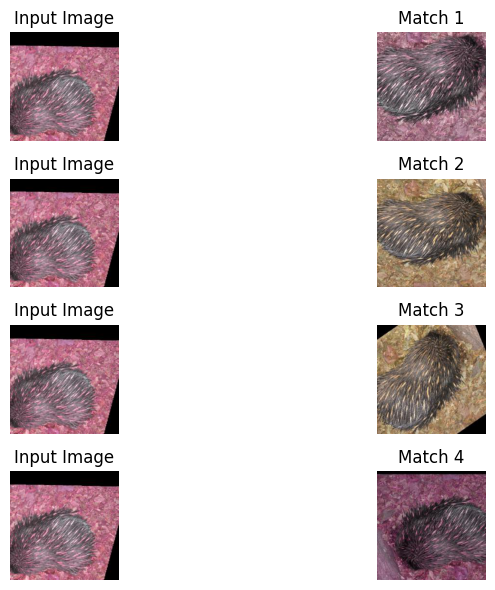

In [59]:
score= top_k_matches(image_path=test_img_paths[7], model= feature_extractor, k=4)

In [62]:
# Example usage
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/4/45/Eopsaltria_australis_-_Mogo_Campground.jpg/640px-Eopsaltria_australis_-_Mogo_Campground.jpg"
image_url2 = "https://equusmagazine.com/wp-content/uploads/migrations/equus/horse-galloping-on-sand.jpg"

pehle scores: [('D:/yogi/shoppin/ImageNet-Mini/augmented_images\\n01729977\\ILSVRC2012_val_00000029_aug_0.JPEG', array([[-0.03639012]], dtype=float32)), ('D:/yogi/shoppin/ImageNet-Mini/augmented_images\\n01729977\\ILSVRC2012_val_00000029_aug_13.JPEG', array([[-0.03818752]], dtype=float32)), ('D:/yogi/shoppin/ImageNet-Mini/augmented_images\\n01729977\\ILSVRC2012_val_00000029_aug_14.JPEG', array([[0.00670927]], dtype=float32)), ('D:/yogi/shoppin/ImageNet-Mini/augmented_images\\n01729977\\ILSVRC2012_val_00000029_aug_15.JPEG', array([[-0.04342954]], dtype=float32)), ('D:/yogi/shoppin/ImageNet-Mini/augmented_images\\n01729977\\ILSVRC2012_val_00000029_aug_16.JPEG', array([[-0.04342693]], dtype=float32)), ('D:/yogi/shoppin/ImageNet-Mini/augmented_images\\n01729977\\ILSVRC2012_val_00000029_aug_19.JPEG', array([[-0.03083865]], dtype=float32)), ('D:/yogi/shoppin/ImageNet-Mini/augmented_images\\n01729977\\ILSVRC2012_val_00000029_aug_2.JPEG', array([[-0.02284805]], dtype=float32)), ('D:/yogi/shopp

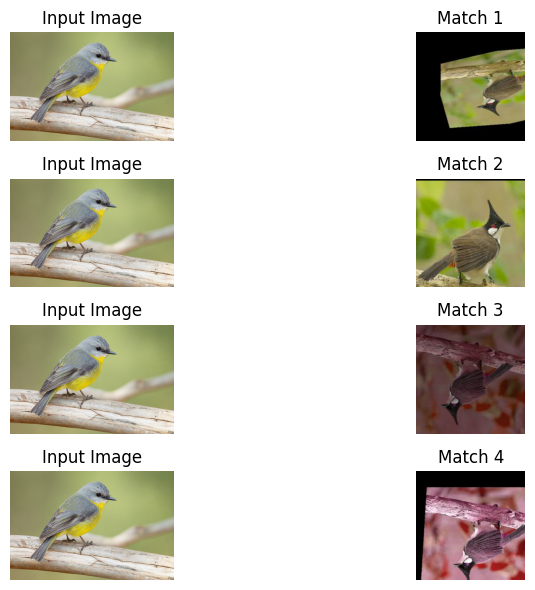

In [64]:
score= top_k_matches(url=image_url, model= feature_extractor, k=4)